# Run CellRank using moslin couplings (ABpxp)
Run CellRank 2 with these couplings.  

## Preliminaries

### Import packages

In [1]:
# single-cell packages
import scanpy as sc
import scvelo as scv
import cellrank as cr
from cellrank.kernels import RealTimeKernel, ConnectivityKernel
from cellrank.estimators import GPCCA
from cellrank.estimators.mixins._utils import StatesHolder

# rest
import pickle
import warnings
import numpy as np
import pandas as pd
import os
import sys
import subprocess
from itertools import chain
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import moslin_utils as mu
from moslin_utils.constants import DATA_DIR, FIG_DIR

Check whether rpy2 works (needed only for gene trend plotting)

In [2]:
def set_r_path():
    # Get the path to the current Python interpreter
    python_path = sys.executable

    # Extract the conda environment name from the Python path
    env_name = os.path.basename(os.path.dirname(os.path.dirname(python_path)))
    print(f"Using the conda environment `{env_name}`")

    # Get the path to the R executable in the conda environment
    r_path = subprocess.check_output(["mamba", "run", "-n", env_name, "which", "R"]).decode().strip()

    # The R home directory is the parent directory of the R executable
    r_home_path = os.path.dirname(os.path.dirname(r_path))

    # Append 'lib/R' to the R home path
    r_home_path = os.path.join(r_home_path, "lib", "R")
    # print(f"Using `{r_home_path}` for the R directory")

    # Set the R_HOME environment variable
    os.environ["R_HOME"] = r_home_path

Make sure we're setting the path to R correctly. 

In [3]:
# set_r_path()

In [4]:
import rpy2.robjects as robjects

try:
    # Test whether the R package 'stats' can be loaded
    robjects.r("library(stats)")
    robjects.r("library(mgcv)")
    print("rpy2 is correctly installed")
except:
    print("rpy2 is not installed or not working properly")

R[write to console]: Lade nötiges Paket: nlme

R[write to console]: This is mgcv 1.9-0. For overview type 'help("mgcv-package")'.



rpy2 is correctly installed


Check the CellRank version

In [5]:
cr.logging.print_version_and_date()

Running CellRank 2.0.4, on 2024-06-29 15:26.


Check other versions

In [6]:
cr.logging.print_versions()

cellrank==2.0.4 scanpy==1.10.1 anndata==0.10.7 numpy==1.26.4 numba==0.59.1 scipy==1.11.4 pandas==2.2.2 pygpcca==1.0.4 scikit-learn==1.4.0 statsmodels==0.14.2 scvelo==0.3.2 pygam==0.9.1 matplotlib==3.9.0 seaborn==0.13.2


### Dependencies

This notebook depends on [ML_2024-03-11_compute_couplings.ipynb](ML_2024-03-11_compute_couplings.ipynb) and [ML_2024-03-12_palantir.ipynb](ML_2024-03-12_palantir.ipynb). 

### Define utility functions

### Set up paths

Define the paths to load data, cache results and write figure panels.

In [7]:
FIG_DIR = FIG_DIR / "packer_c_elegans"
DATA_DIR = DATA_DIR / "packer_c_elegans"

Set up the paths to save figures.

In [8]:
scv.settings.figdir = str(FIG_DIR)
sc.settings.figdir = str(FIG_DIR)
cr.settings.figdir = str(FIG_DIR)

### Set global parameters

In [9]:
DPI_SAVE = 400

scv.settings.set_figure_params(
    "scvelo",
    dpi_save=DPI_SAVE,
    dpi=80,
    transparent=True,
    fontsize=20,
    color_map="viridis",
)

sc.set_figure_params(frameon=False, scanpy=False)

scv.settings.plot_prefix = ""

In [10]:
# should figures just be displayed or also saved?
save_figure = False

In [11]:
LINEAGE_INFO = "abpxp"  # restrict our analysis to this lineage
METHOD = "moslin"
random_state = 0

KEY_STATE_COLORS = {
    "Ciliated neuron": "#B3424C",
    "Non-ciliated neuron": "#4C8EB4",
    "Glia and excretory": "#95AD4D",
}

### Import the data

Import the AnnData object, created in a previous notebook. 

In [12]:
adata = sc.read(DATA_DIR / f"ML_2024-05-16_c_elegans_abpxp_{METHOD}_adata.h5ad")
adata

AnnData object with n_obs × n_vars = 6476 × 20222
    obs: 'idx', 'barcode', 'n.umi', 'time.point', 'batch', 'Size_Factor', 'cell.type', 'cell.subtype', 'plot.cell.type', 'raw.embryo.time', 'embryo.time', 'embryo.time.bin', 'raw.embryo.time.bin', 'lineage', 'passed_initial_QC_or_later_whitelisted', 'random_precise_lineage', 'clusters', 'coarse_clusters', 'assigned_batch_time', 'marginals', 'time_point'
    var: 'Ensembl', 'gene_short_name', 'Symbol', 'Family', 'Protein', 'Entrez_ID', 'TF', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'coarse_clusters_colors', 'hvg', 'log1p', 'pca', 'raw.embryo.time_colors', 'time_point_colors'
    obsm: 'X_pca', 'X_umap'

Import the moslin-computed couplings, computed in a previous notebook. 

In [13]:
with open(DATA_DIR / f"ML_2024-05-16_c_elegans_abpxp_{METHOD}_tmats.pkl", "rb") as f:
    tmats = pickle.load(f)

Import MAGIC computed data and the Palantir pseudotime, computed in a previous notebook. 

In [14]:
# import
magic_imputed_data = pd.read_csv(DATA_DIR / "palantir" / "ML_2024-03-12_magic_imputed_data.csv", index_col=0)
palantir_pseudotime = pd.read_csv(DATA_DIR / "palantir" / "ML_2024-03-12_palantir_pseudotime.csv", index_col=0)

# make sure the indices overlap perfectly
assert (magic_imputed_data.index == adata.obs.index).all(), "MAGIC indices do not match with ours."
assert (palantir_pseudotime.index == adata.obs.index).all(), "Palantir pseudotime indices do not match with ours."

# write
adata.layers["magic_imputed_data"] = magic_imputed_data
adata.obs["palantir_pseudotime"] = palantir_pseudotime
adata

AnnData object with n_obs × n_vars = 6476 × 20222
    obs: 'idx', 'barcode', 'n.umi', 'time.point', 'batch', 'Size_Factor', 'cell.type', 'cell.subtype', 'plot.cell.type', 'raw.embryo.time', 'embryo.time', 'embryo.time.bin', 'raw.embryo.time.bin', 'lineage', 'passed_initial_QC_or_later_whitelisted', 'random_precise_lineage', 'clusters', 'coarse_clusters', 'assigned_batch_time', 'marginals', 'time_point', 'palantir_pseudotime'
    var: 'Ensembl', 'gene_short_name', 'Symbol', 'Family', 'Protein', 'Entrez_ID', 'TF', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'coarse_clusters_colors', 'hvg', 'log1p', 'pca', 'raw.embryo.time_colors', 'time_point_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'magic_imputed_data'

## Various visualizations

### Visualize in an embedding

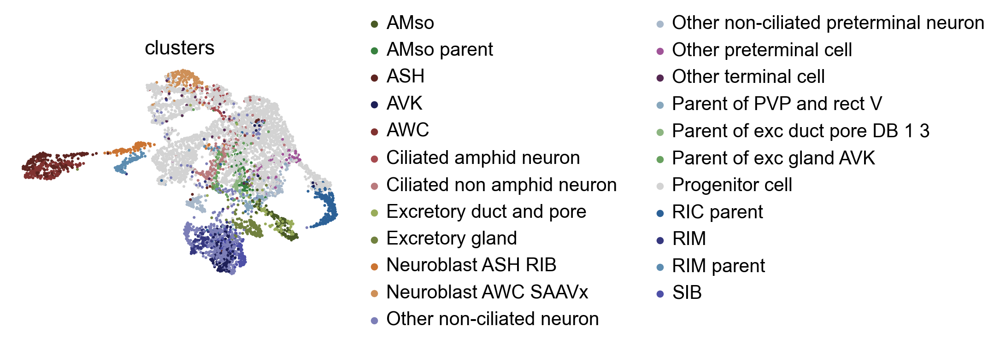

In [15]:
fig_kwargs = {"color": "clusters", "legend_loc": "right", "s": 30, "basis": "umap"}
if save_figure:
    fig_kwargs["save"] = "umap_clusters.pdf"
scv.pl.scatter(adata, **fig_kwargs)

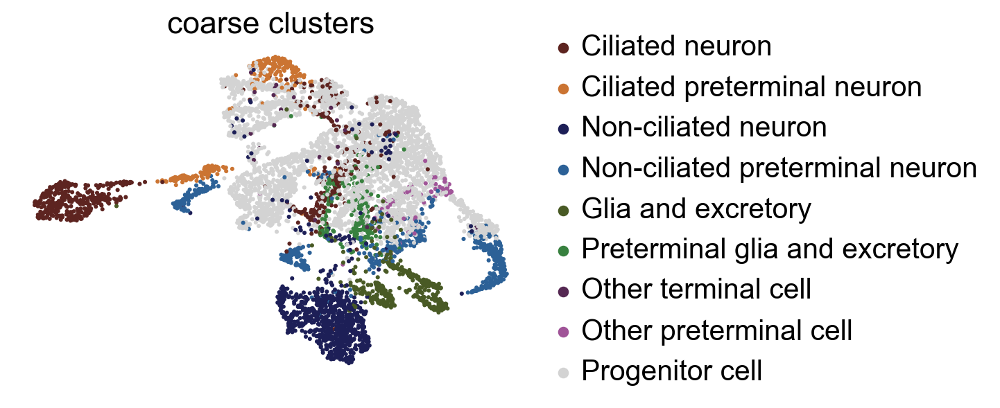

In [16]:
fig_kwargs = {"color": "coarse_clusters", "legend_loc": "right", "s": 30, "basis": "umap"}
if save_figure:
    fig_kwargs["save"] = "umap_coarse_clusters.pdf"
scv.pl.scatter(adata, **fig_kwargs)

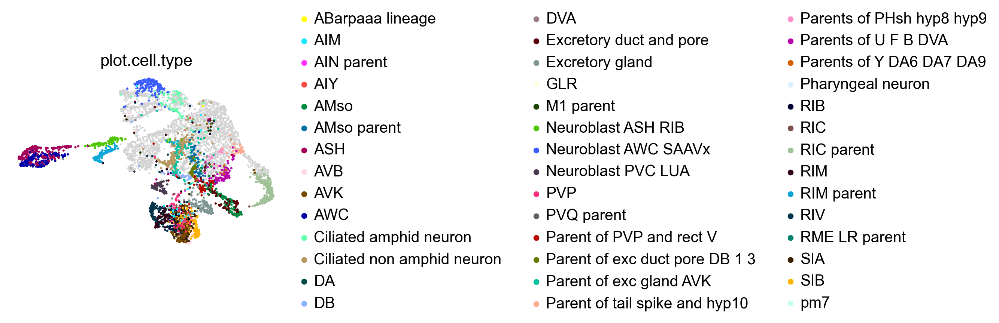

In [17]:
fig_kwargs = {"color": "plot.cell.type", "legend_loc": "right", "s": 30, "basis": "umap"}
if save_figure:
    fig_kwargs["save"] = "umap_lineage.pdf"
scv.pl.scatter(adata, **fig_kwargs)

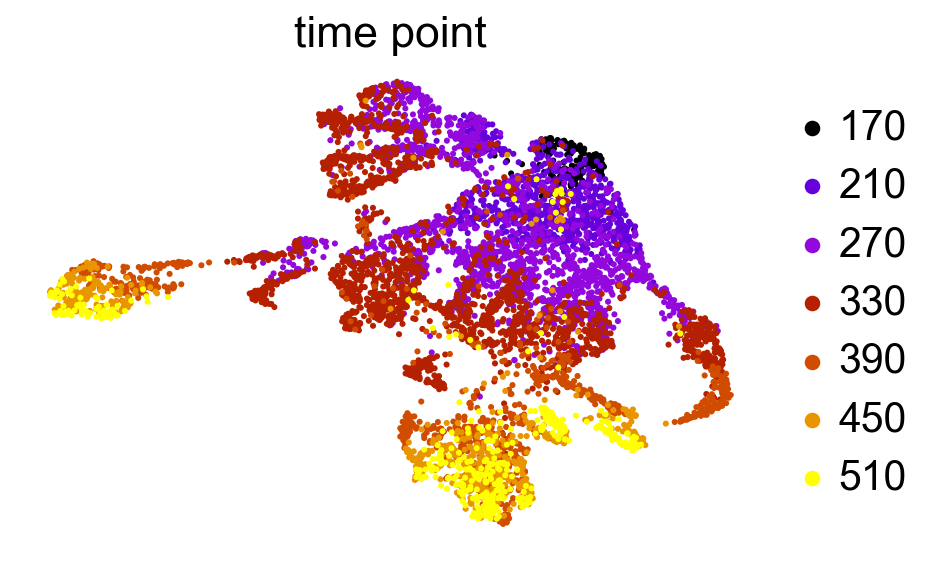

In [18]:
fig_kwargs = {"color": "time_point", "legend_loc": "right", "s": 30}
if save_figure:
    fig_kwargs["save"] = "umap_time_point.pdf"
scv.pl.scatter(adata, **fig_kwargs)

### Visualize the Palantir pseudotime

First, highlight the root cell on the UMAP

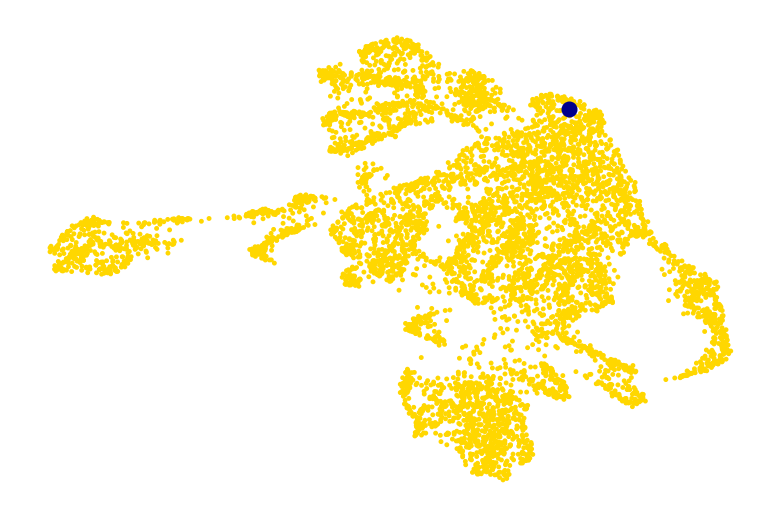

In [19]:
root_idx = np.flatnonzero(adata.obs["palantir_pseudotime"] == 0.0)[0]
fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "umap_palantir_root.pdf"


scv.pl.scatter(adata, c=root_idx, **fig_kwargs)

Next, show the actual pseudotime in the embedding

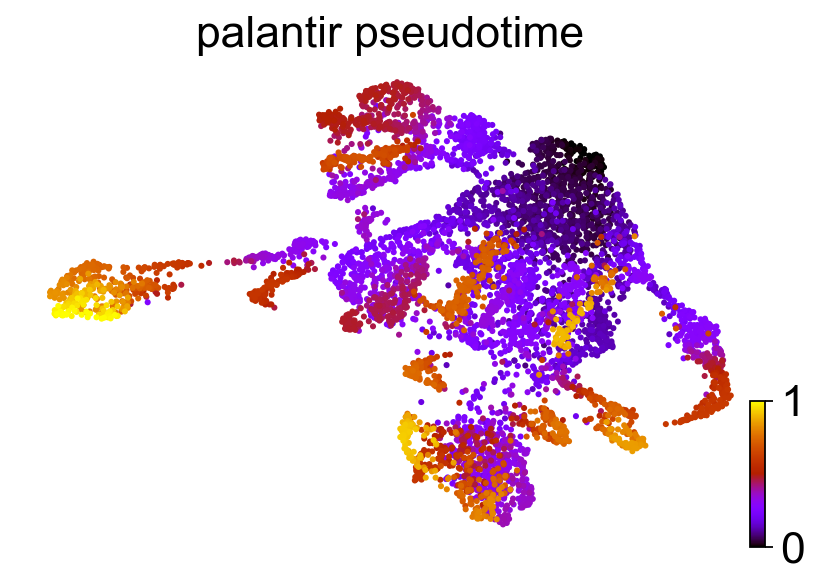

In [20]:
fig_kwargs = {
    "color": "palantir_pseudotime",
    "legend_loc": "right",
    "s": 30,
    "color_map": "gnuplot",
}
if save_figure:
    fig_kwargs["save"] = "umap_palantir_pseudotime.pdf"

scv.pl.scatter(adata, **fig_kwargs)

Scanpy violin plotting does not like numerical values as categories, thus we make a copy of that `obs` columns and change the dtype. 

In [21]:
adata.obs["time_point_str"] = adata.obs["time_point"].copy()
adata.obs["time_point_str"] = adata.obs["time_point_str"].cat.rename_categories(
    {str(cat) for cat in adata.obs["time_point_str"].cat.categories}
)
adata.uns["time_point_str_colors"] = adata.uns["time_point_colors"].copy()

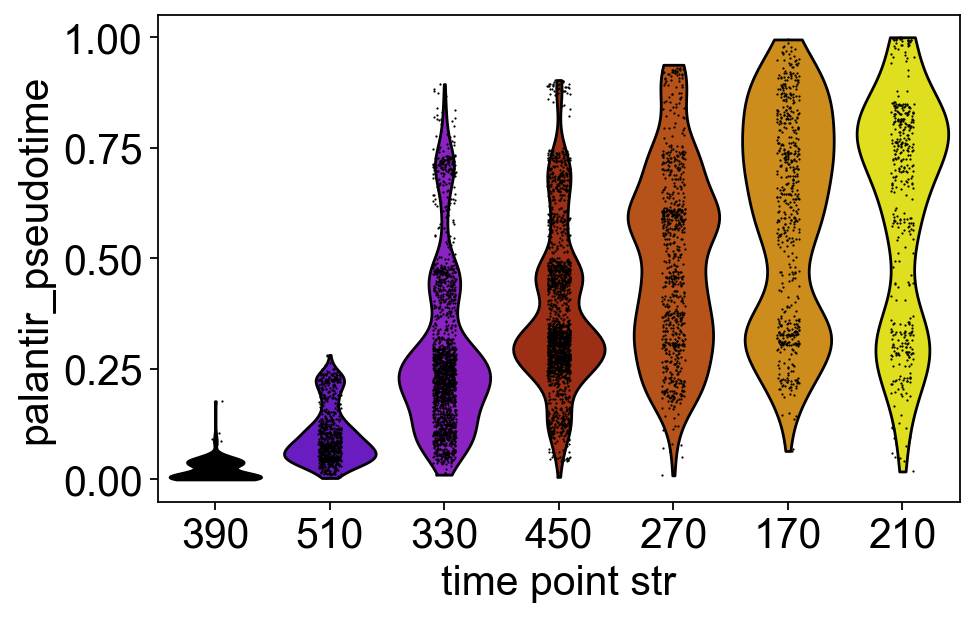

In [22]:
fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "_palantir_time_point.pdf"

sc.pl.violin(adata, keys=["palantir_pseudotime"], groupby="time_point_str", **fig_kwargs)

### Cell state distribution within each terminal population

For each of the main groups we have here, like ciliated neurons, what sub-types do they consist of?

In [23]:
annot_kwargs = {"labeldistance": 1.4, "pctdistance": 1.7, "fontsize": 10}

Ciliated neurons

Showing the distribution for Ciliated neuron (n_cells=647)


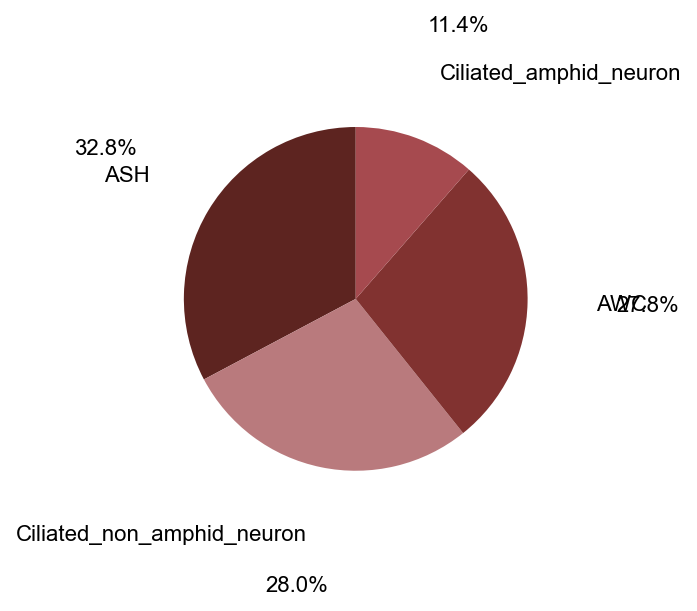

Showing the distribution for Ciliated neuron (n_cells=647)


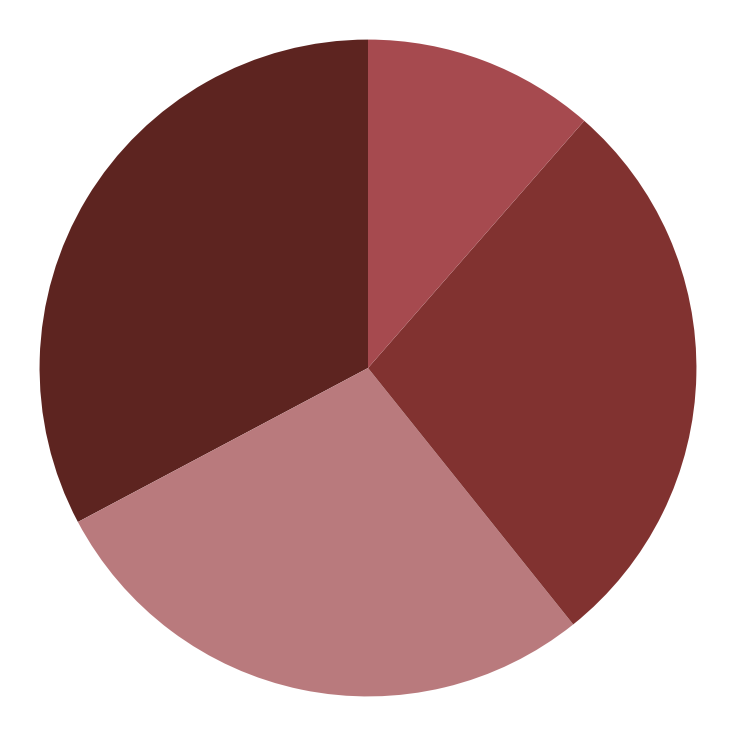

In [24]:
state = "Ciliated neuron"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

Non-ciliated neurons

Showing the distribution for Non-ciliated neuron (n_cells=890)


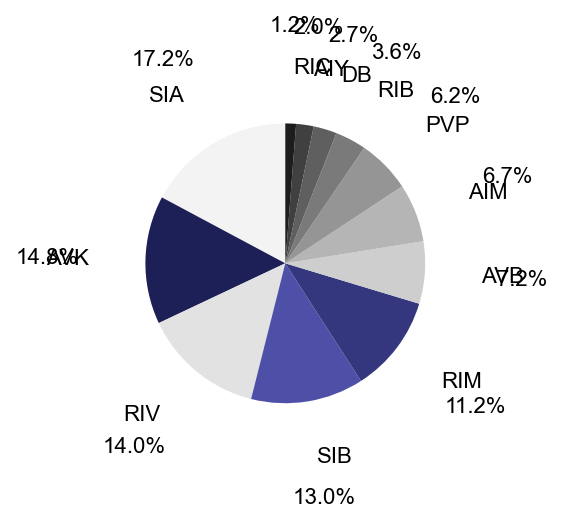

Showing the distribution for Non-ciliated neuron (n_cells=890)


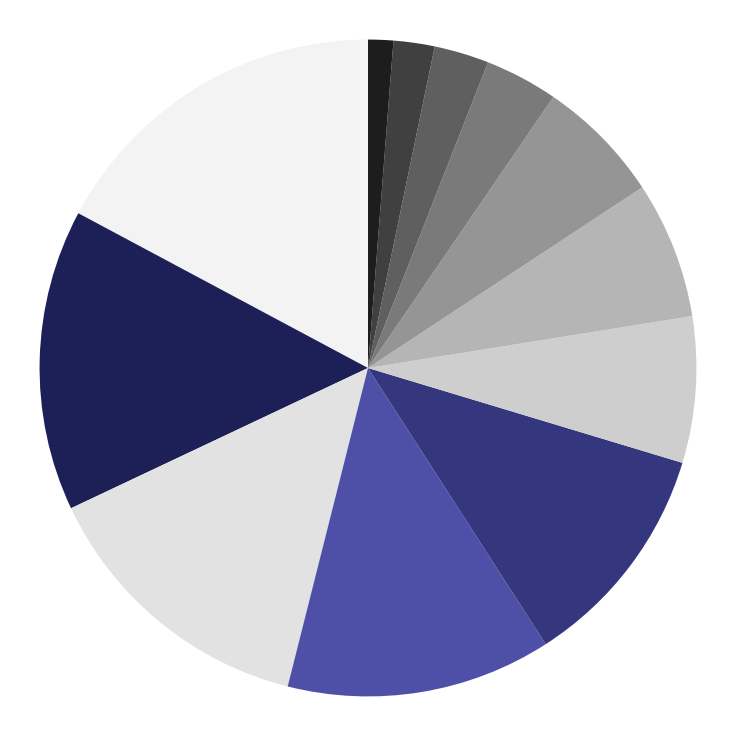

In [25]:
state = "Non-ciliated neuron"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

Glia and excretory

Showing the distribution for Glia and excretory (n_cells=361)


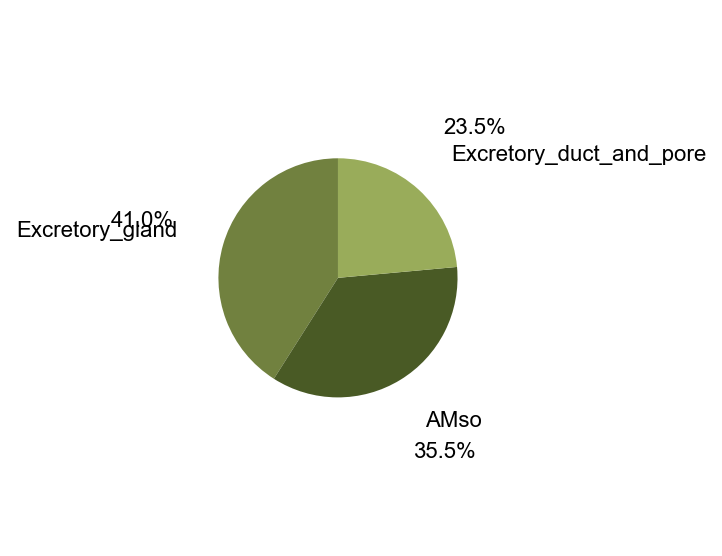

Showing the distribution for Glia and excretory (n_cells=361)


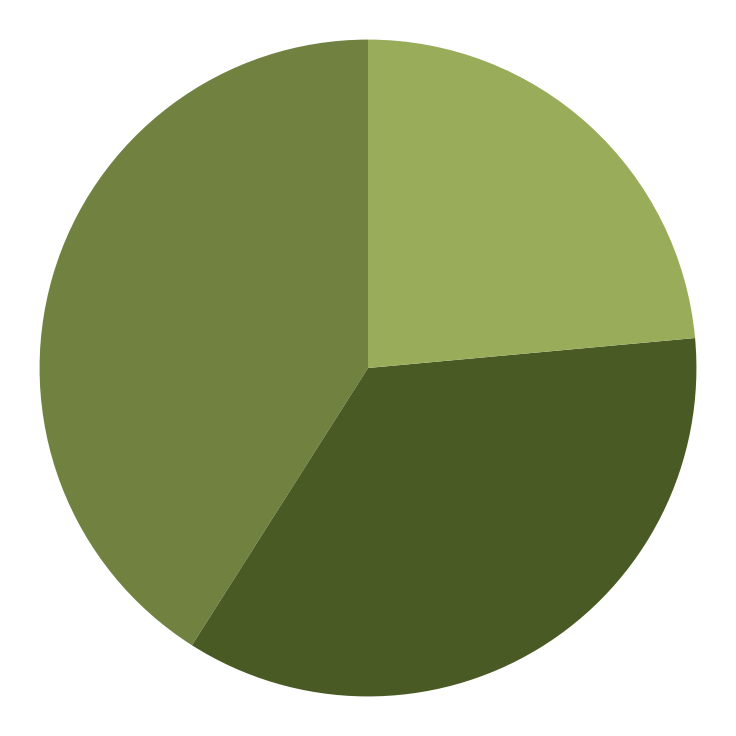

In [26]:
state = "Glia and excretory"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

Other terminal cell

Showing the distribution for Other terminal cell (n_cells=30)


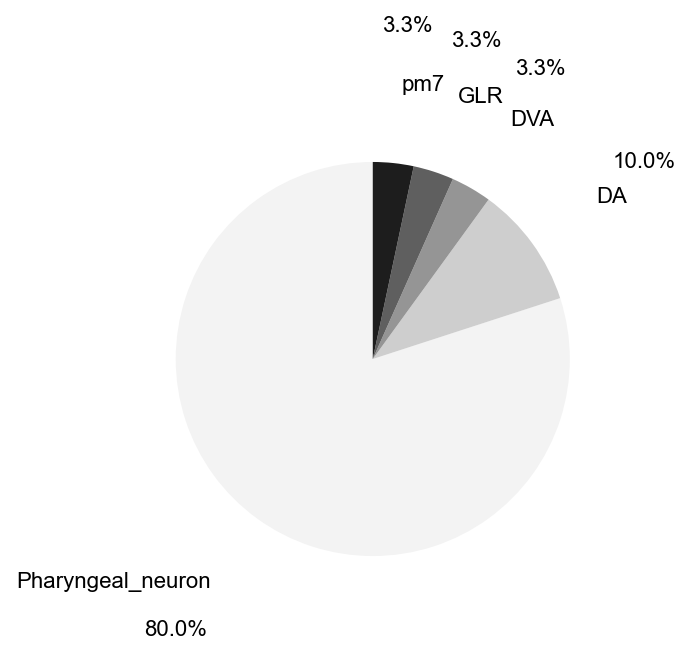

Showing the distribution for Other terminal cell (n_cells=30)


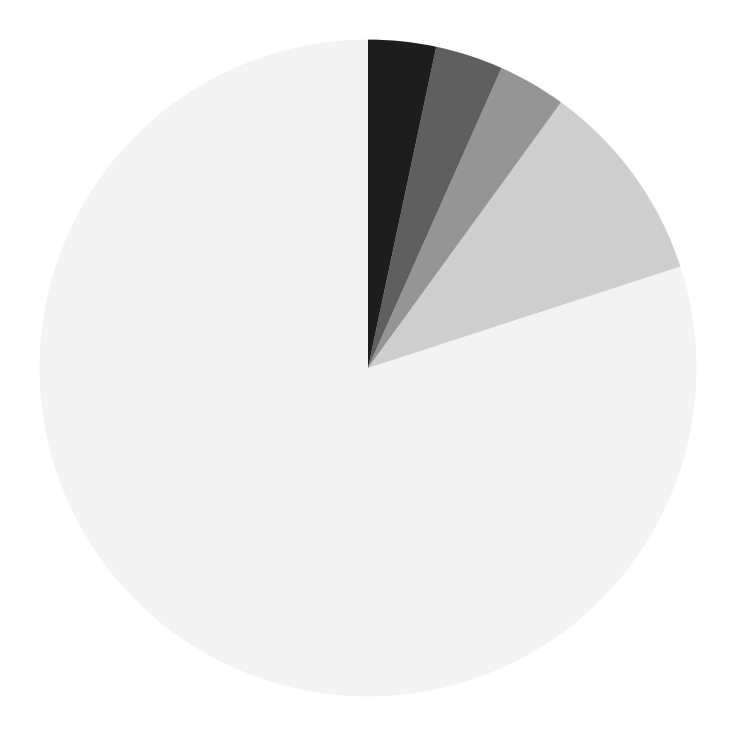

In [27]:
state = "Other terminal cell"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

### Cell state distribution within each pre-terminal population

For each of the main groups we have here, like ciliated neurons, what sub-types do they consist of?

In [28]:
annot_kwargs = {"labeldistance": 1.4, "pctdistance": 1.7, "fontsize": 10}

Ciliated preterminal neurons

Showing the distribution for Ciliated preterminal neuron (n_cells=279)


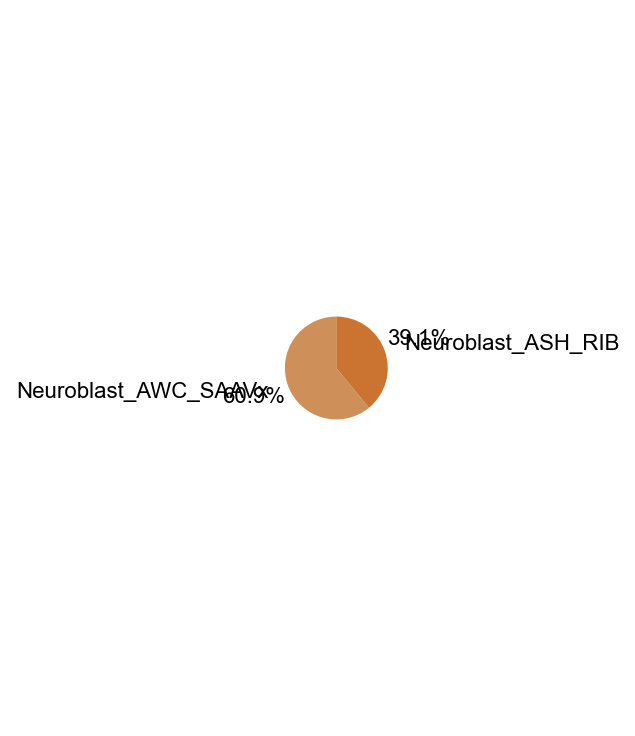

Showing the distribution for Ciliated preterminal neuron (n_cells=279)


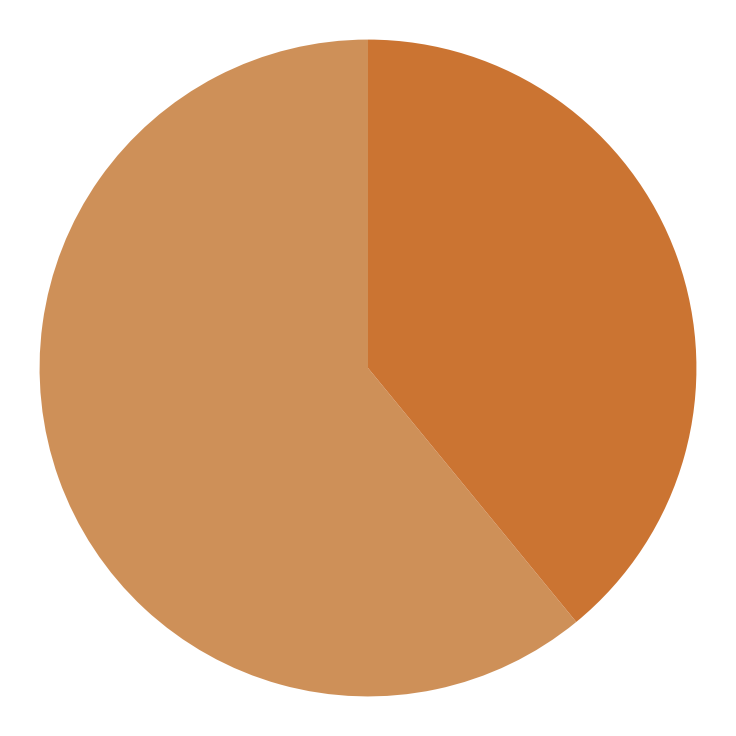

In [29]:
state = "Ciliated preterminal neuron"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

Non-ciliated preterminal neurons

Showing the distribution for Non-ciliated preterminal neuron (n_cells=576)


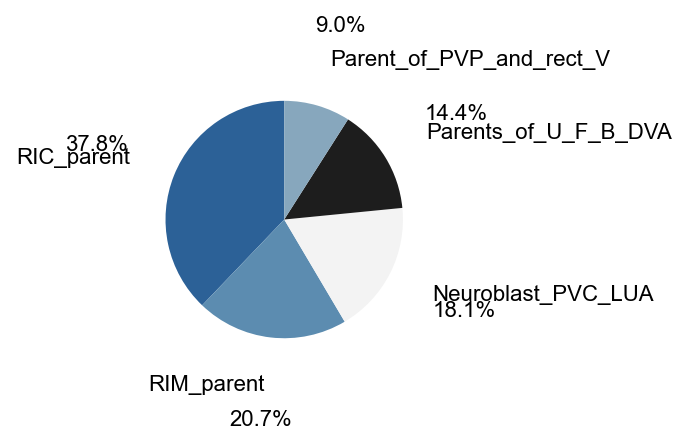

Showing the distribution for Non-ciliated preterminal neuron (n_cells=576)


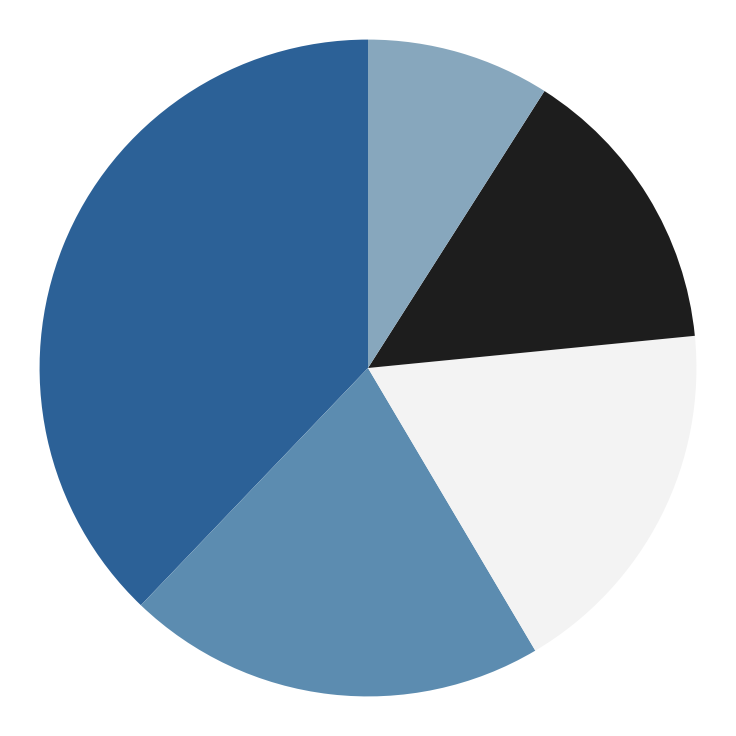

In [30]:
state = "Non-ciliated preterminal neuron"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

Preterminal glia and excretory

Showing the distribution for Preterminal glia and excretory (n_cells=231)


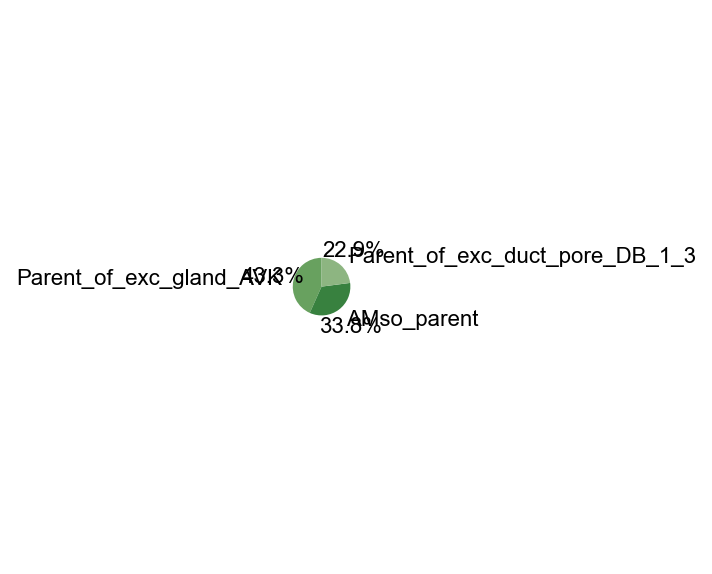

Showing the distribution for Preterminal glia and excretory (n_cells=231)


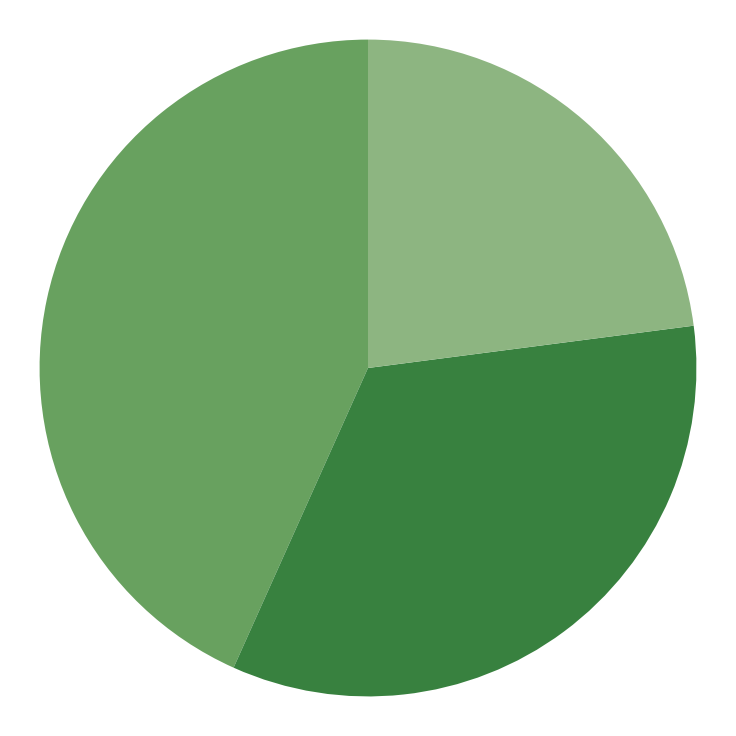

In [31]:
state = "Preterminal glia and excretory"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

Other preterminal cell

Showing the distribution for Other preterminal cell (n_cells=90)


/Users/mlange/Projects/moslin_analysis_3/src/moslin_utils/pl/_plotting.py:79: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


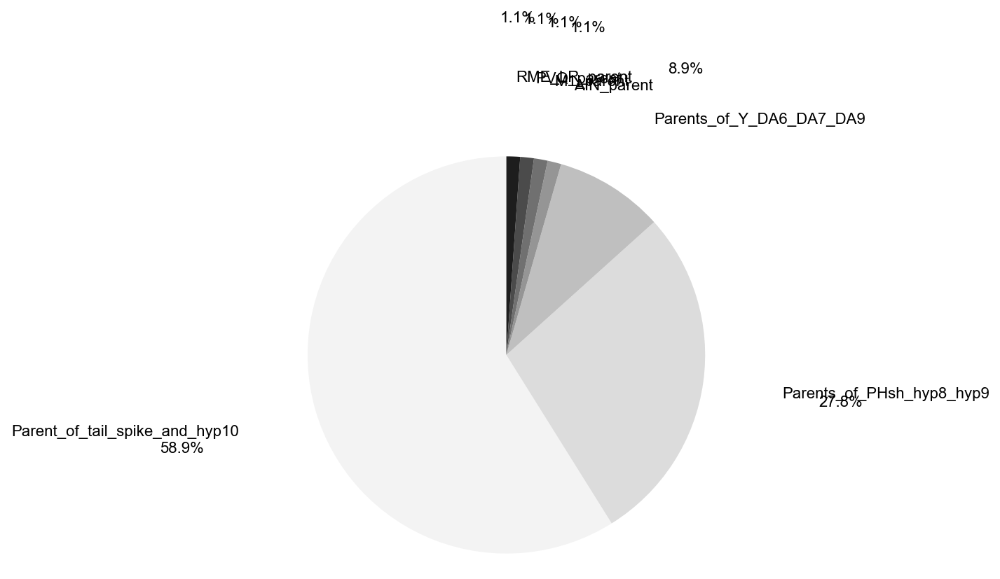

Showing the distribution for Other preterminal cell (n_cells=90)


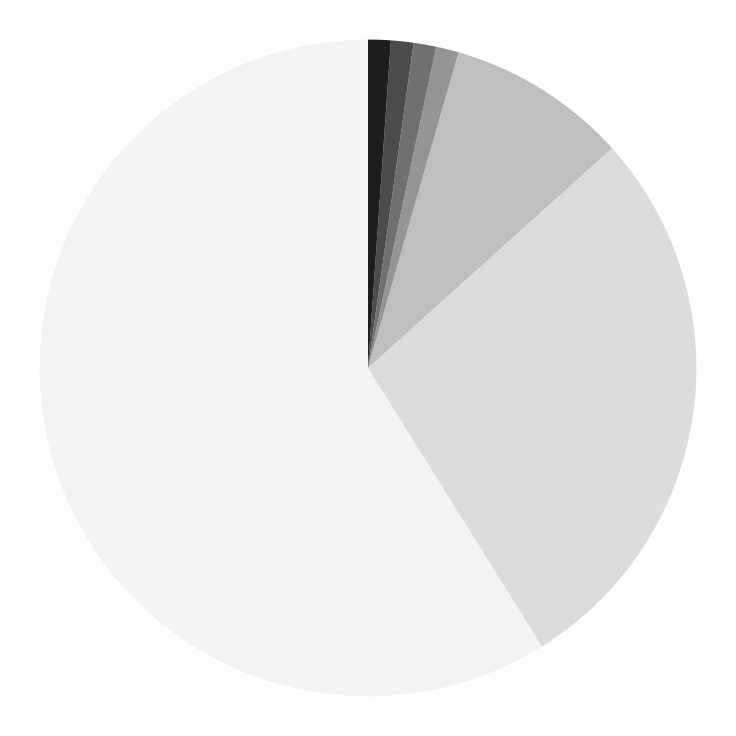

In [32]:
state = "Other preterminal cell"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}_annotated.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=True, **annot_kwargs, **fig_kwargs)

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = FIG_DIR / "pie_charts" / f"{state}.pdf"
mu.pl.plot_pie_chart(adata, state=state, annot=False, **fig_kwargs)

## CellRank 2 analysis

### Initialize a kernel

Compute a k-NN graph

In [33]:
sc.pp.neighbors(adata, n_pcs=10, n_neighbors=30, random_state=random_state)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Use the pre-computed couplings to get a Markov chain description of the system. 

In [34]:
# initialize from pre-computed couplings
rtk = RealTimeKernel(adata, time_key="time_point", couplings=tmats)

# combine with local connectivities
rtk.compute_transition_matrix(self_transitions="connectivities")

# combine wiht global connectivities
conn = ConnectivityKernel(adata).compute_transition_matrix()
kernel = 0.9 * rtk + 0.1 * conn

100%|██████████| 6/6 [00:00<00:00, 98.27time pair/s]


Somehow, this converts the categories to float. Let's change that back, and let's also make sure they are strings. 

In [35]:
cats = adata.obs["time_point"].cat.categories
if isinstance(cats[0], (int, float, complex, np.int64)):
    mapping = {cat: str(int(cat)) for cat in cats}
    adata.obs["time_point"] = adata.obs["time_point"].cat.rename_categories(mapping)

Visualize the computed dynamics with random walks of a fixed length. 

In [36]:
max_iter_list = [300, 400, 500, 600, 700]

100%|██████████| 200/200 [00:11<00:00, 17.35sim/s]


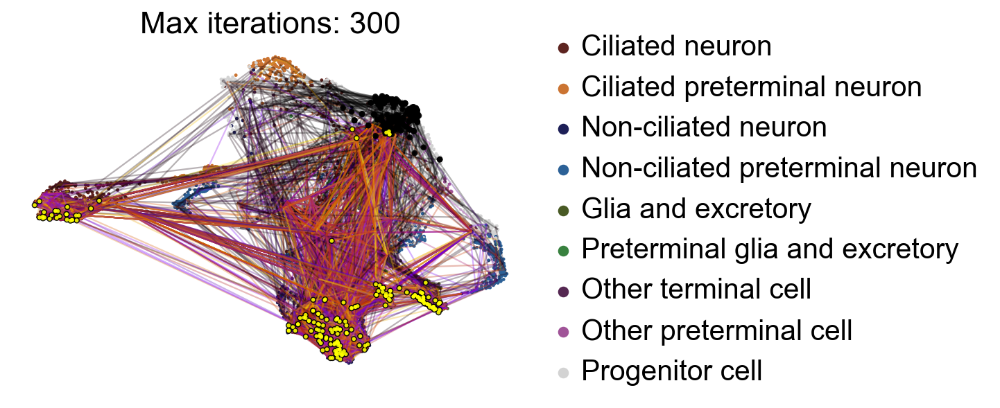

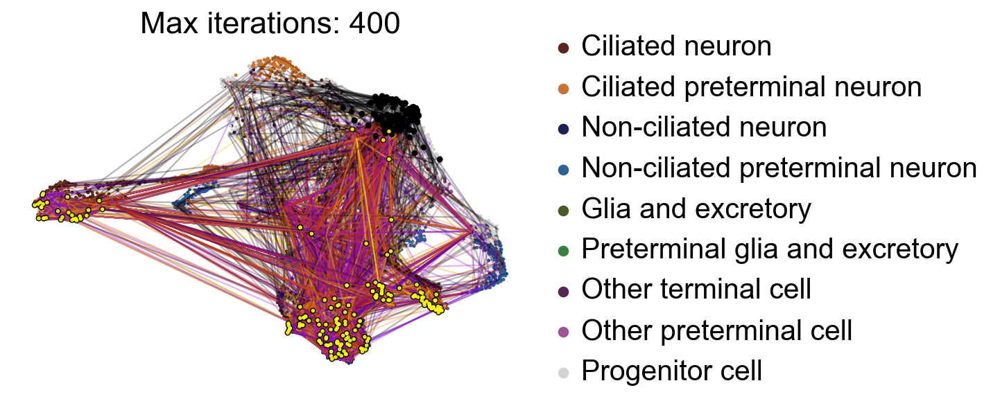

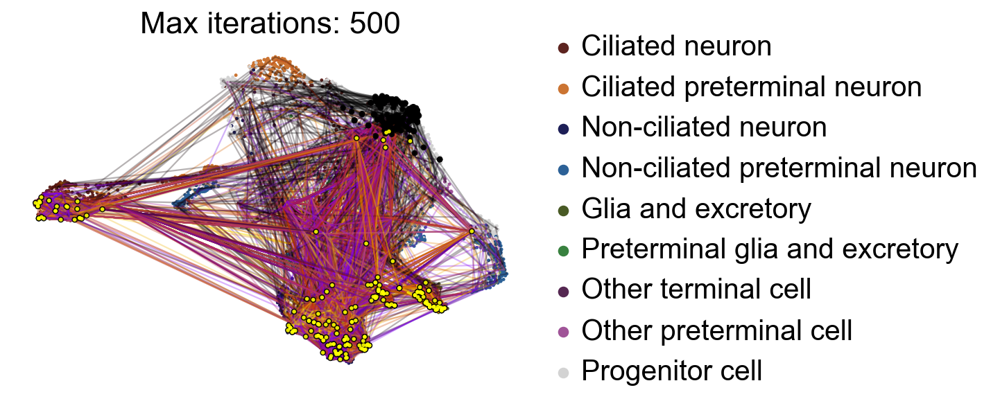

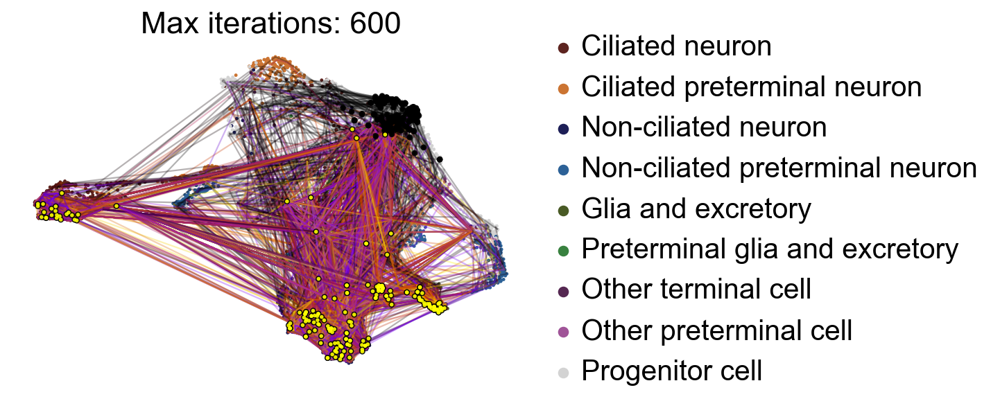

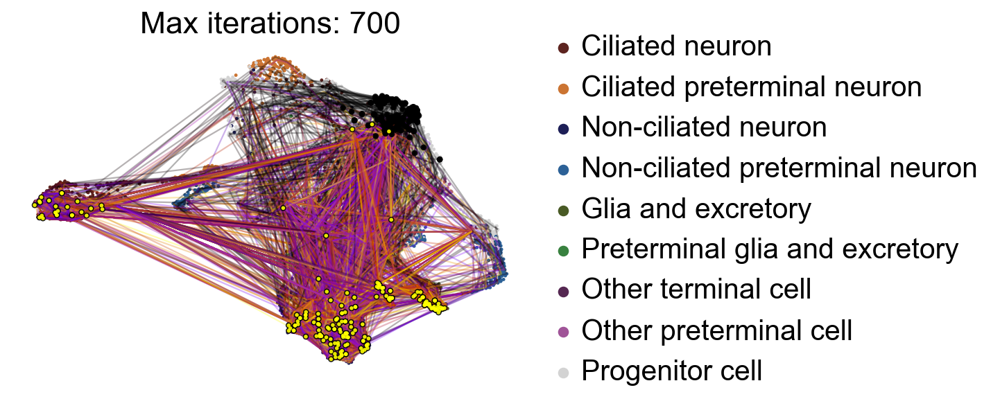

In [37]:
for max_iter in max_iter_list:
    fig_kwargs = {
        "n_sims": 200,
        "max_iter": max_iter,
        "start_ixs": {"time_point": "170"},
        "c": "coarse_clusters",
        "legend_loc": "right",
        "seed": 0,
        "title": f"Max iterations: {max_iter}",
    }
    if save_figure:
        fig_kwargs["save"] = f"umap_random_walks_max_iter_{max_iter}.pdf"

    kernel.plot_random_walks(cmap="gnuplot", **fig_kwargs)

### Compute terminal states

In [38]:
g = GPCCA(kernel)

[bs-mbpas-0057:76616] shmem: mmap: an error occurred while determining whether or not /var/folders/j6/fcqzqhwj6y7b1nzw3241zgjw0000gr/T//ompi.bs-mbpas-0057.504/jf.0/181469184/sm_segment.bs-mbpas-0057.504.ad10000.0 could be created.


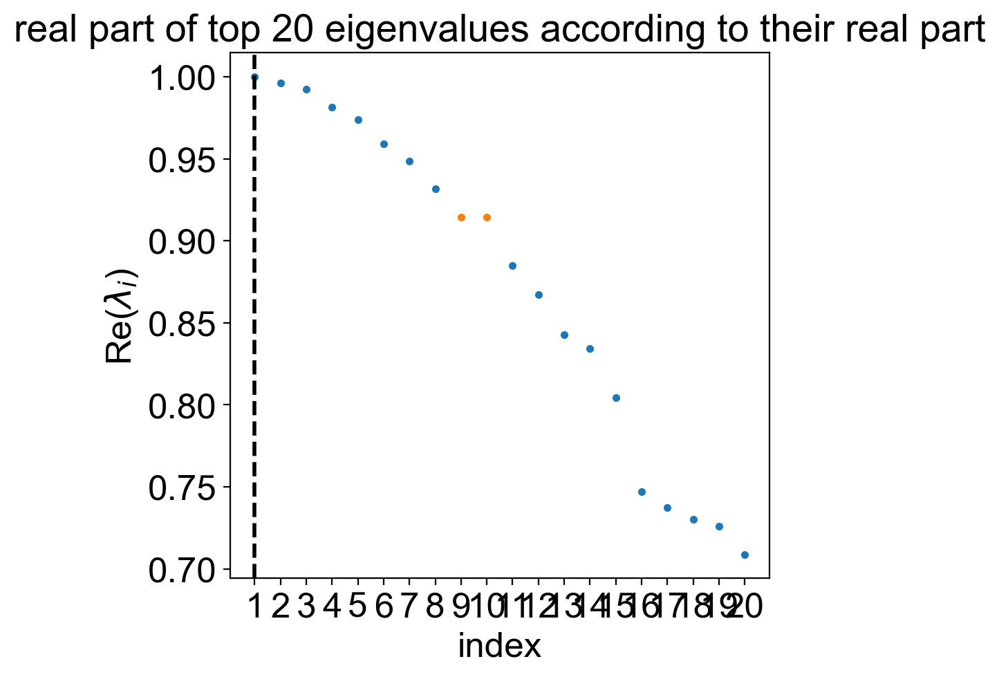

In [39]:
g.compute_schur()
g.plot_spectrum(real_only=True)

/Users/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


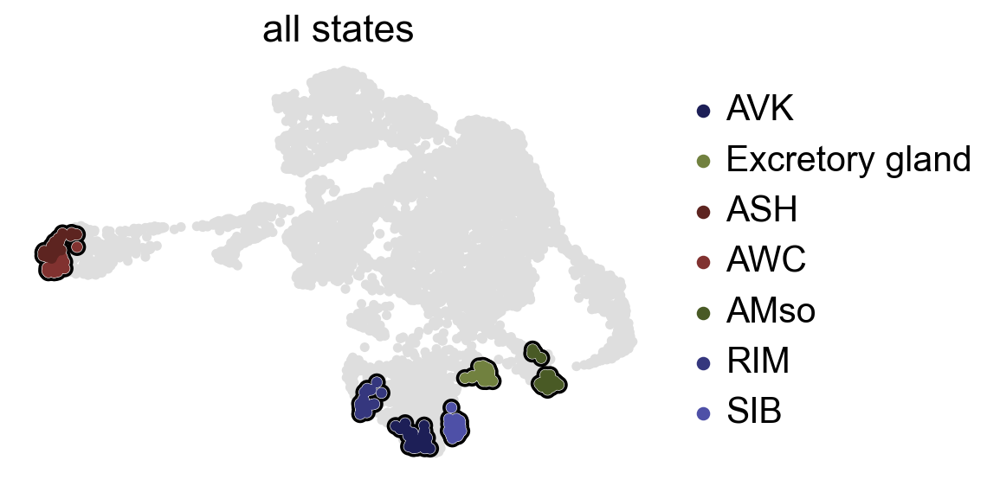

In [40]:
g.compute_macrostates(n_states=7, cluster_key="clusters")

fig_kwargs = {"legend_loc": "right", "s": 100, "which": "all"}
if save_figure:
    fig_kwargs["save"] = f"umap_macrostates_{METHOD}.pdf"

g.plot_macrostates(**fig_kwargs)

Define the order of these macrostates

In [44]:
# create a lookup table to link coarse clusters to clusters
df = (adata.obs.groupby(["clusters", "coarse_clusters"]).size() > 0).unstack()
lookup = {state: list(df.loc[df[state]].index) for state in adata.obs["coarse_clusters"].cat.categories}

# use the lookup to get an ordered list of states
ordered_clusters = list(chain(*[clusters for clusters in lookup.values()]))

# carry this over to macrostates
macrostates = [state for state in ordered_clusters if state in g.macrostates.cat.categories]
macrostates

['ASH', 'AWC', 'AVK', 'RIM', 'SIB', 'AMso', 'Excretory_gland']

Re-order macrostates accordingly. 

In [45]:
g._macrostates = StatesHolder(
    assignment=g._macrostates.assignment.cat.reorder_categories(macrostates),
    probs=None,
    memberships=g._macrostates.memberships[macrostates],
    colors=g._macrostates.memberships[macrostates].colors,
)

In [46]:
macrostate_time = mu.ul.get_state_time(adata, g, states="macrostates", obs_col="time_point")
macrostate_time

{'ASH': 460.0,
 'AWC': 474.0,
 'AVK': 490.0,
 'RIM': 462.0,
 'SIB': 474.0,
 'AMso': 476.0,
 'Excretory_gland': 492.0}

/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/IPython/core/events.py:82: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)
/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


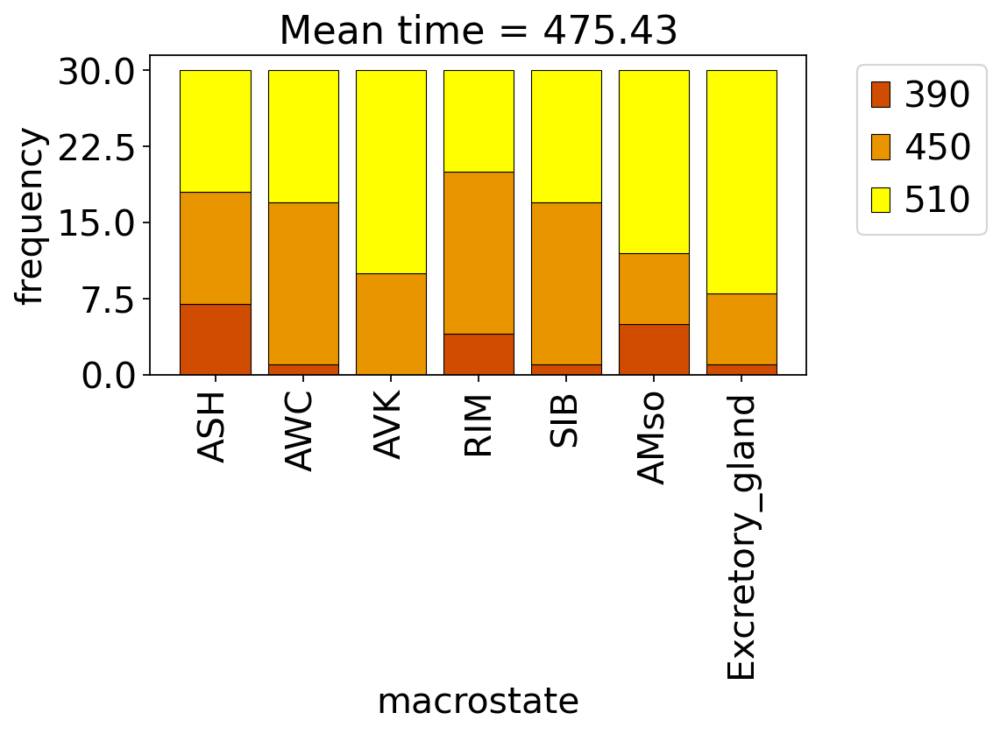

In [47]:
fig_kwargs = {
    "key": "time_point",
    "figsize": (6, 3),
    "labelrot": 90,
    # "legend_loc": None,
    "title": f"Mean time = {np.mean(list(macrostate_time.values())):.2f}",
}


if save_figure:
    fig_kwargs["save"] = f"bar_time_point_{METHOD}.pdf"

g.plot_macrostate_composition(
    **fig_kwargs,
)

Look into macrostate purity

In [49]:
macrostate_purity = mu.ul.get_state_purity(adata, g, states="macrostates", obs_col="clusters")
macrostate_purity

{'ASH': 1.0,
 'AWC': 1.0,
 'AVK': 1.0,
 'RIM': 1.0,
 'SIB': 1.0,
 'AMso': 1.0,
 'Excretory_gland': 1.0}

/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/IPython/core/events.py:82: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)
/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


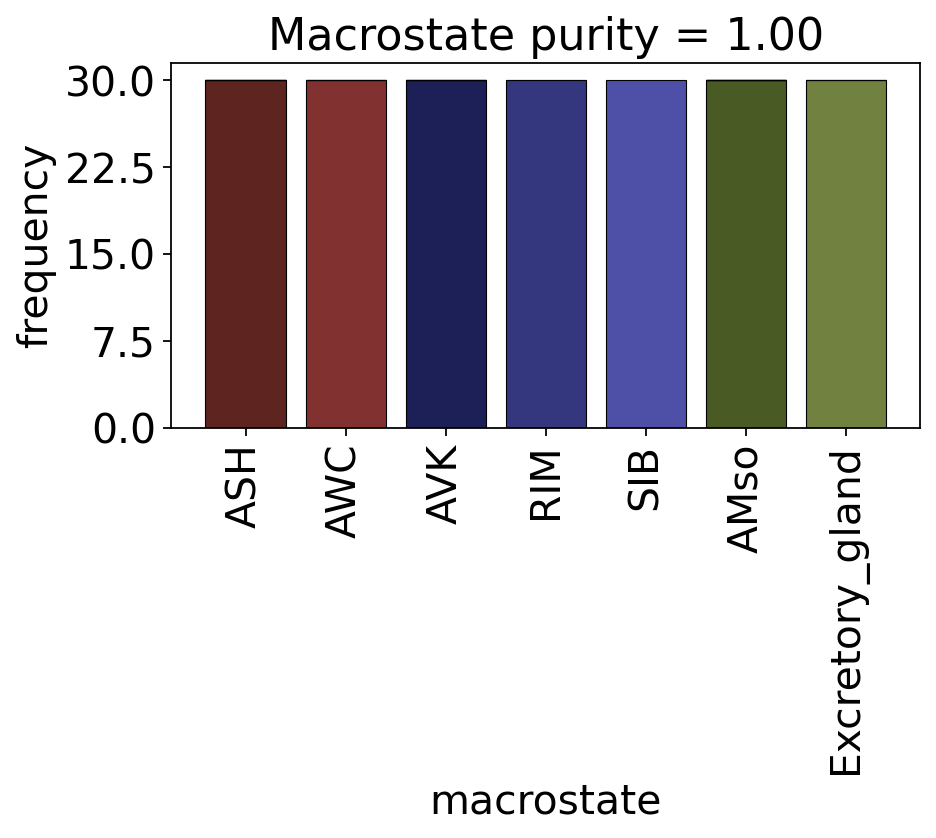

In [50]:
fig_kwargs = {
    "key": "clusters",
    "figsize": (6, 3),
    "labelrot": 90,
    "legend_loc": None,
    "title": f"Macrostate purity = {np.mean(list(macrostate_purity.values())):.2f}",
}

if save_figure:
    fig_kwargs["save"] = f"bar_clusters_{METHOD}.pdf"

g.plot_macrostate_composition(**fig_kwargs)

### Compute fate probabilities towards all terminal states

In [51]:
g.set_terminal_states()

GPCCA[kernel=(0.9 * RealTimeKernel[n=6476] + 0.1 * ConnectivityKernel[n=6476]), initial_states=None, terminal_states=['AMso', 'ASH', 'AVK', 'AWC', 'Excretory_gland', 'RIM', 'SIB']]

/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/cluster/project/treutlein/USERS/mlange/mambaforge/envs/moslin_3/lib/python3.11/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp

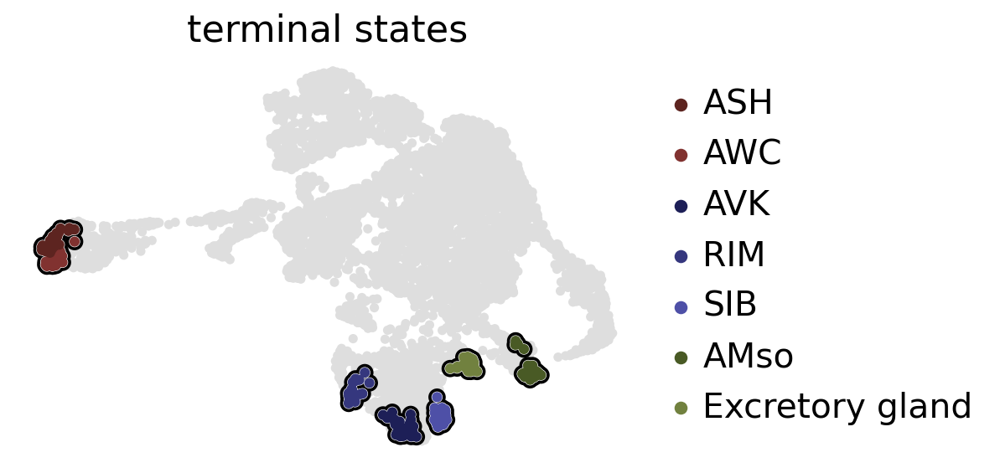

In [52]:
g.plot_macrostates(legend_loc="right", s=100, which="terminal")

100%|██████████| 7/7 [00:02<00:00,  2.68/s]
[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


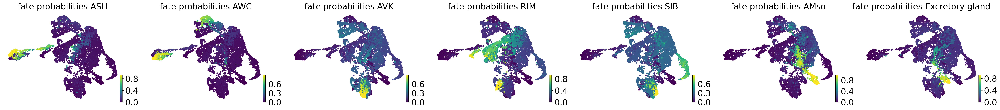

In [53]:
g.compute_fate_probabilities()

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "umap_all_fate_probs.pdf"

g.plot_fate_probabilities(same_plot=False, s=50, dpi=150, **fig_kwargs)

### Compute fate probabilities towards aggregated terminal states

This is a bit awkward in CellRank at the moment, but will be simplified in a future release. 

In [54]:
# Extract the cell indices for each group of cells. Use the lookup dict from above.
state_dict = {state: list(g.macrostates[g.macrostates.isin(lookup[state])].index) for state in KEY_STATE_COLORS.keys()}

with open(DATA_DIR / "benchmarking" / "state_dict.pkl", "wb") as file:
    pickle.dump(state_dict, file)

# Manually set these to be terminal
g.set_terminal_states(
    states=state_dict,
    cluster_key="coarse_clusters",
)

GPCCA[kernel=(0.9 * RealTimeKernel[n=6476] + 0.1 * ConnectivityKernel[n=6476]), initial_states=None, terminal_states=['Ciliated neuron', 'Glia and excretory', 'Non-ciliated neuron']]

Again, re-order these and assign colors. 

In [55]:
g._term_states = StatesHolder(
    assignment=g._term_states.assignment.cat.reorder_categories(KEY_STATE_COLORS.keys()),
    probs=None,
    memberships=None,
    colors=KEY_STATE_COLORS.values(),
)

# also re-order in AnnData
adata.obs["term_states_fwd"] = adata.obs["term_states_fwd"].cat.reorder_categories(KEY_STATE_COLORS.keys())

# assign colors in AnnData as well
adata.uns["term_states_fwd_colors"] = [KEY_STATE_COLORS[state] for state in adata.obs["term_states_fwd"].cat.categories]

Plot the resulting aggregates terminal states

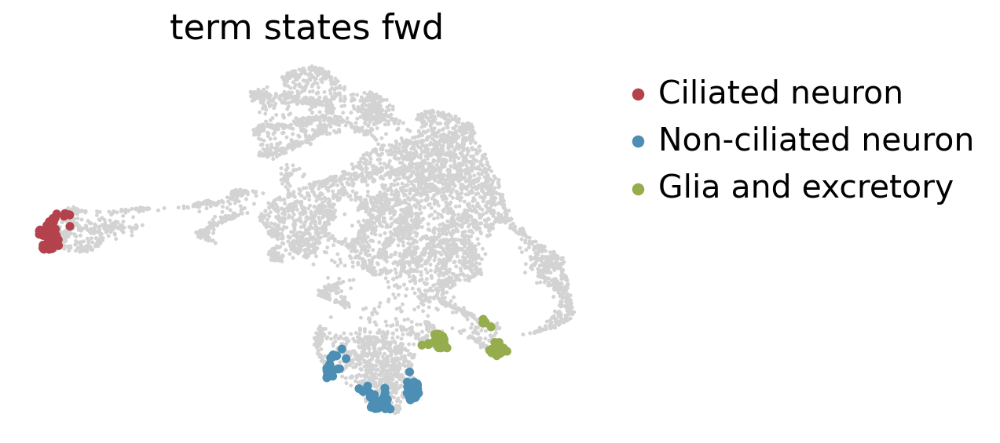

In [56]:
scv.pl.scatter(adata, c="term_states_fwd", s=100)

This combines the top 30 cells for each terminal state to represent the aggregated states. 

100%|██████████| 3/3 [00:01<00:00,  1.51/s]
[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


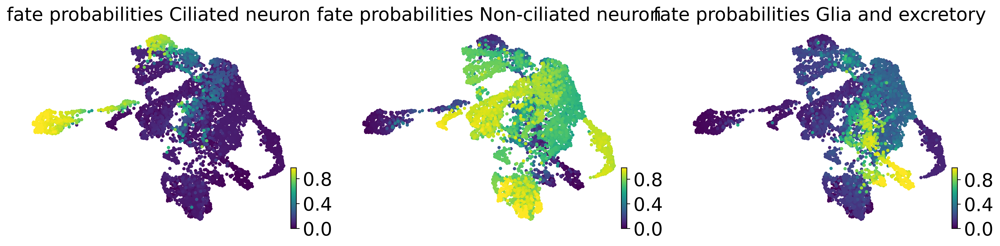

In [57]:
g.compute_fate_probabilities()

fig_kwargs = {"same_plot": False, "dpi": DPI_SAVE, "s": 50}
if save_figure:
    fig_kwargs["save"] = f"umap_aggregated_fate_probabilities_{METHOD}.pdf"

g.plot_fate_probabilities(**fig_kwargs)

### Visualize aggregated fate probabilities

Visualize the fate bias within progenitor cells

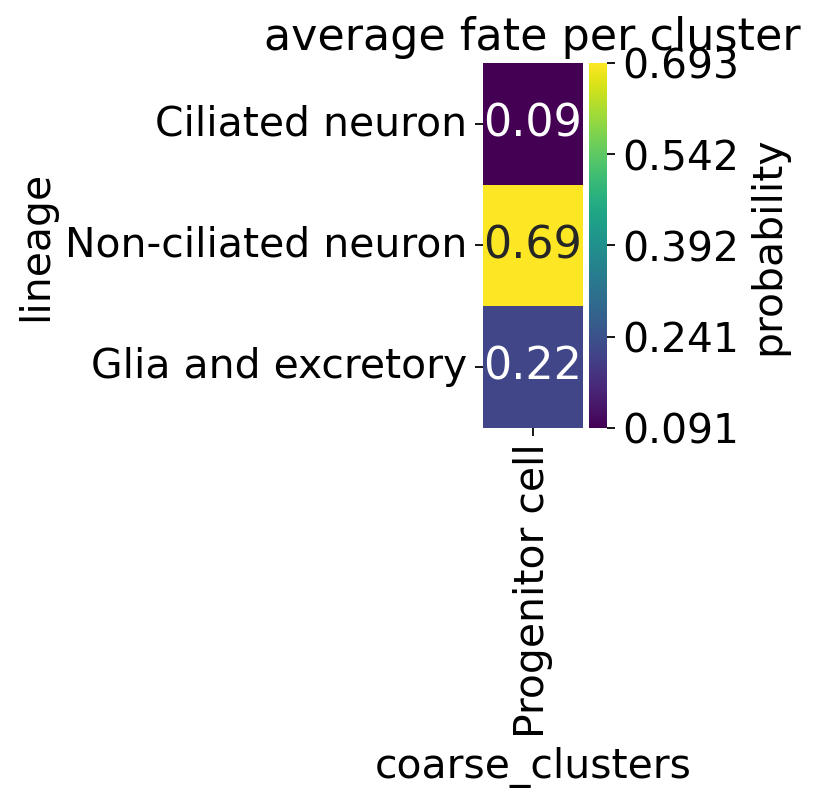

In [54]:
figure_kwargs = {
    "cluster_key": "coarse_clusters",
    "mode": "heatmap",
    "clusters": ["Progenitor cell"],
    "figsize": (1, 3),
}
if save_figure:
    figure_kwargs["save"] = f"heatmap_progenitor_bias_{METHOD}.pdf"
cr.pl.aggregate_fate_probabilities(adata, **figure_kwargs)

Visualize fate probabilities as violin plots, grouped by preterminal state

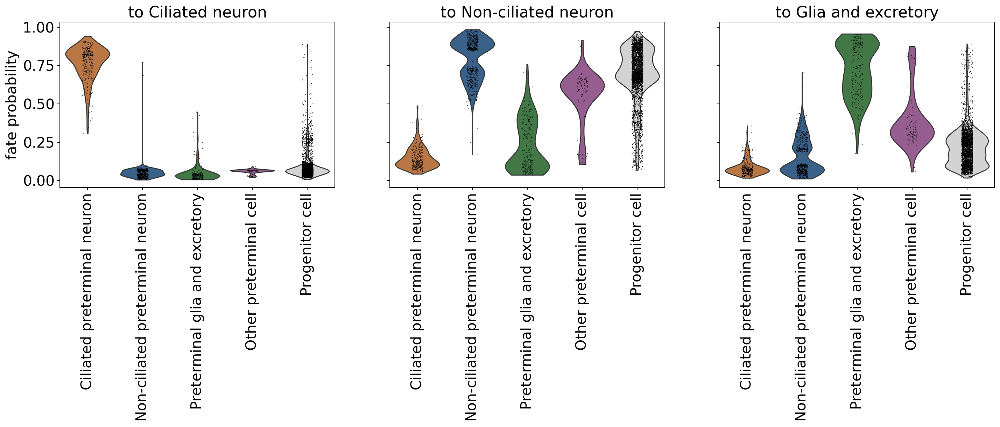

In [59]:
# subset to the interesting categories (i.e. not the final cell types)
progenitor_clusters = [
    "Ciliated preterminal neuron",
    "Non-ciliated preterminal neuron",
    "Preterminal glia and excretory",
    "Other preterminal cell",
    "Progenitor cell",
]

# define a corresponding mask
mask = np.in1d(adata.obs["coarse_clusters"], progenitor_clusters)

# and plot
fig_kwargs = {"mode": "violin", "cluster_key": "coarse_clusters", "clusters": progenitor_clusters}
if save_figure:
    fig_kwargs["save"] = f"violin_aggregated_fate_probabilities_{METHOD}.pdf"

cr.pl.aggregate_fate_probabilities(adata[mask], sharey=True, **fig_kwargs)

Show this in a more aggregated form using heatmaps over just the average

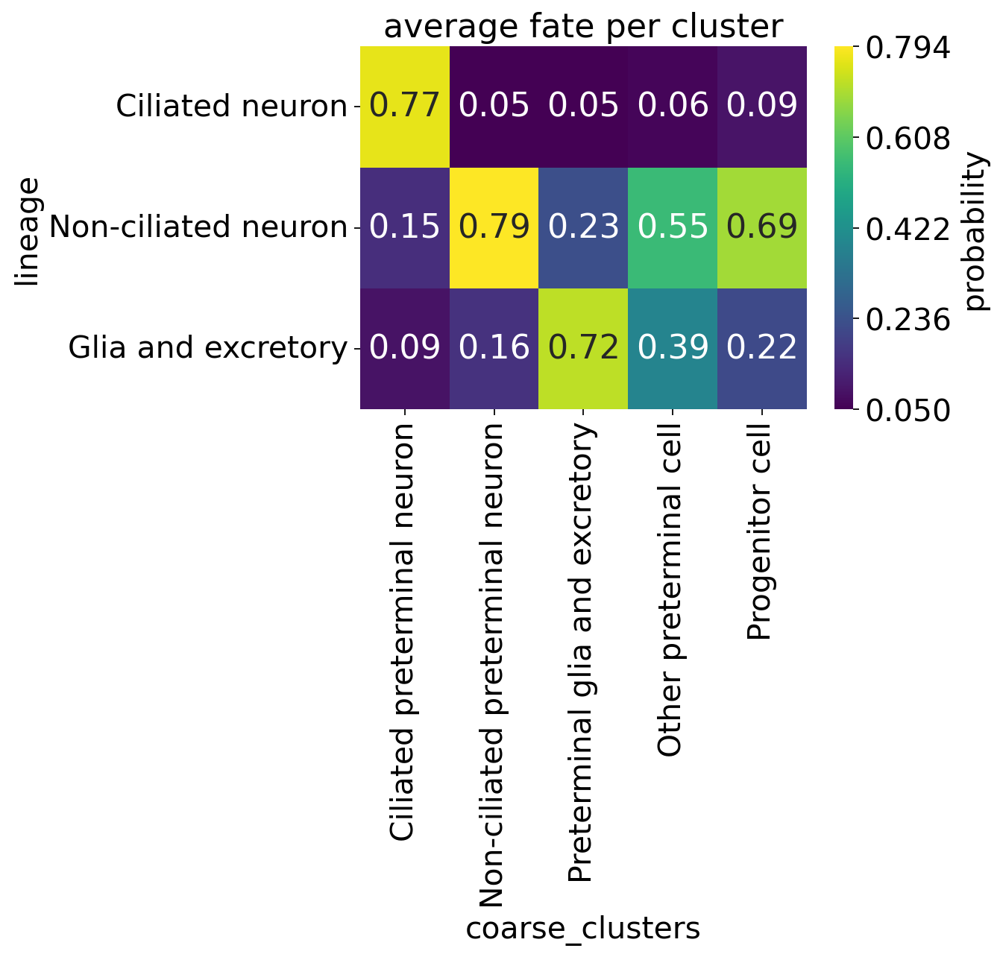

In [60]:
# and plot
fig_kwargs = {"mode": "heatmap", "cluster_key": "coarse_clusters", "clusters": progenitor_clusters}

if save_figure:
    fig_kwargs["save"] = f"heatmap_aggregated_fate_probabilities_{METHOD}.pdf"

cr.pl.aggregate_fate_probabilities(adata, **fig_kwargs)

### Compute lineage drivers

In [61]:
corrs = g.compute_lineage_drivers()

# Merge this on the `.var` annotation to have information about which of these are also TFs!
new_var = adata.var.merge(right=corrs, how="left", left_index=True, right_index=True)

# make sure the index is exactly the same as in adata.var
assert (adata.var.index == new_var.index).all(), "Indices do not fully overlap"

# put the new var anntations in place
adata.var = new_var

Driver genes for Ciliated neurons: 

In [62]:
ciliated_df = mu.ul.return_drivers(adata, state="Ciliated neuron", n_genes=20, only_tf=True)
ciliated_df

,Ensembl,highly_variable,Family,TF,Protein,Ciliated neuron_pval,Ciliated neuron_qval,Ciliated neuron_corr,means,dispersions
gene_short_name,,,,,,,,,,
daf-19,WBGene00000914,True,RFX,True,F33H1.1d.1;F33H1.1e.1;F33H1.1a.1;F33H1.1b.1;F3...,0.000000e+00,0.000000e+00,0.479336,0.148558,1.067321
ceh-57,WBGene00007416,True,Homeobox,True,C07E3.5.1;,1.933014e-224,3.476469e-222,0.377821,0.023640,0.675483
ceh-36,WBGene00000457,True,Homeobox,True,C37E2.4.1;,6.777226e-171,1.057178e-168,0.333146,0.353916,2.200174
T03G11.3,WBGene00020196,True,zf-C2H2,True,T03G11.3.1;,4.102488e-158,6.209379e-156,0.321209,0.060468,1.138707
sox-4,WBGene00015716,True,HMG,True,C12D12.5a.1;C12D12.5b.1;,3.968471e-157,5.889904e-155,0.320265,0.043131,1.701779
syd-9,WBGene00044068,True,zf-C2H2,True,ZK867.1d.1;ZK867.1c.1;,1.311340e-122,1.713372e-120,0.284606,0.726670,1.730344
sptf-1,WBGene00009743,True,zf-C2H2,True,F45H11.1b.1;F45H11.1a.1;,1.071486e-119,1.364984e-117,0.281336,0.680558,2.054025
fkh-2,WBGene00001434,True,Fork_head,True,T14G12.4a.1;T14G12.4b.2;T14G12.4b.1;,6.832542e-119,8.632155e-117,0.280425,0.196830,1.857609
cey-4,WBGene00000475,False,CSD,True,Y39A1C.3.1;Y39A1C.3.2;,8.847427e-107,1.056645e-104,0.266239,0.669581,0.485932


Check for a list of known TFs

In [63]:
known_drivers_ciliated = ["sptf-1", "daf-19", "ceh-36", "fkh-2", "tub-1", "daf-3"]
mask = np.in1d(known_drivers_ciliated, ciliated_df.index)

if not mask.all():
    print(f"Missing {np.array(known_drivers_ciliated)[~mask]}. ")
else:
    print("Found all genes!")

Found all genes!


Driver genes for Non-ciliated neurons: 

In [64]:
non_ciliated_df = mu.ul.return_drivers(adata, state="Non-ciliated neuron", n_genes=20, only_tf=True)
non_ciliated_df

,Ensembl,highly_variable,Family,TF,Protein,Non-ciliated neuron_pval,Non-ciliated neuron_qval,Non-ciliated neuron_corr,means,dispersions
gene_short_name,,,,,,,,,,
unc-62,WBGene00006796,True,Homeobox,True,T28F12.2h.1;T28F12.2e.1;T28F12.2b.2;T28F12.2f....,5.517881e-161,2.008377e-158,0.323941,0.686969,2.348703
fax-1,WBGene00001400,True,RXR-like,True,F56E3.4a.1;F56E3.4b.1;,2.942453e-109,5.230381e-107,0.269215,0.577109,2.776687
zag-1,WBGene00006970,False,zf-C2H2,True,F28F9.1.1;,1.145071e-103,1.882227e-101,0.262444,0.238246,0.799084
ceh-27,WBGene00000449,False,Homeobox,True,F46F3.1b.1;F46F3.1a.1;,9.752377e-82,1.242372e-79,0.233621,0.934959,1.840021
cnd-1,WBGene00000561,True,bHLH,True,C34E10.7.1;,6.507561e-74,7.652392e-72,0.222282,1.021370,3.019688
hmg-1.1,WBGene00001971,False,HMG,True,Y48B6A.14.1;Y48B6A.14.2;,1.331969e-67,1.348464e-65,0.212634,2.202403,1.067535
hlh-13,WBGene00001957,True,bHLH,True,F48D6.3.1;,1.418673e-66,1.390209e-64,0.211017,0.910839,3.940609
unc-3,WBGene00006743,True,COE,True,Y16B4A.1.1;,2.038395e-51,1.535022e-49,0.185327,0.601572,2.650901
ceh-13,WBGene00000437,True,Homeobox,True,R13A5.5.1;R13A5.5.2;,8.219187e-48,5.737293e-46,0.178619,0.140581,0.996781


Check for a list of known TFs (and some new ones we predict). 

In [65]:
known_drivers_non_ciliated = ["fax-1", "zag-1", "cnd-1", "ceh-24", "unc-3", "ctbp-1", "ceh-27", "hlh-13", "hlh-15"]
mask = np.in1d(known_drivers_non_ciliated, non_ciliated_df.index)

if not mask.all():
    print(f"Missing {np.array(known_drivers_non_ciliated)[~mask]}. ")
else:
    print("Found all genes!")

Found all genes!


Driver genes for Glia and excretory cells:

In [66]:
glia_df = mu.ul.return_drivers(adata, state="Glia and excretory", n_genes=20, only_tf=True)
glia_df

,Ensembl,highly_variable,Family,TF,Protein,Glia and excretory_pval,Glia and excretory_qval,Glia and excretory_corr,means,dispersions
gene_short_name,,,,,,,,,,
ceh-37,WBGene00000458,True,Homeobox,True,C37E2.5a.1;C37E2.5b.1;C37E2.5a.2;C37E2.5c.1;C3...,1.097341e-217,8.828977e-215,0.372593,0.330520,2.251799
nhr-23,WBGene00003622,True,THR-like,True,C01H6.5b.1;C01H6.5c.1;C01H6.5d.1;C01H6.5e.1;C0...,3.585469e-164,1.442397e-161,0.326939,0.044760,1.231052
pros-1,WBGene00000448,True,HPD,True,K12H4.1.1;,1.281270e-162,5.022249e-160,0.325483,0.107671,1.705514
atf-8,WBGene00017535,True,TF_bZIP,True,F17A9.3.1;,4.652925e-155,1.734860e-152,0.318269,0.223548,3.021758
alr-1,WBGene00044330,True,Homeobox,True,R08B4.2.1;,1.619068e-141,5.266105e-139,0.304793,0.059831,1.052620
lim-6,WBGene00002988,True,Homeobox,True,K03E6.1b.1;K03E6.1a.1;,2.862834e-125,7.545542e-123,0.287554,0.247609,2.543061
ttx-1,WBGene00006652,True,Homeobox,True,Y113G7A.6a.1;Y113G7A.6b.1;Y113G7A.6d.1;Y113G7A...,1.118859e-91,1.900443e-89,0.247173,0.131875,1.100395
ref-2,WBGene00004335,True,zf-C2H2,True,C47C12.3a.1;C47C12.3b.1;C47C12.3a.2;,6.203465e-77,8.318628e-75,0.226737,0.157262,0.989847
unc-130,WBGene00006853,True,Fork_head,True,C47G2.2.1;,5.187340e-72,6.447062e-70,0.219426,0.036579,0.841971


Check for a list of known TFs. 

In [67]:
known_drivers_glia = ["alr-1", "pros-1", "unc-130", "ttx-1", "ref-2"]
mask = np.in1d(known_drivers_glia, glia_df.index)

if not mask.all():
    print(f"Missing {np.array(known_drivers_glia)[~mask]}. ")
else:
    print("Found all genes!")

Found all genes!


### Driver gene visualization

Start by defining a custom colormap, containing just two colors, one for TFs, one for all other genes. 

In [68]:
# Define a list of colors
colors = ["#C0C0C0", "#000000"]

# Normalize the colormap range
cmap_range = mcolors.Normalize(vmin=0, vmax=len(colors))

# Create the colormap object
cmap = mcolors.ListedColormap(colors)

Define gene sets which should be annotated in the scatter plot. 

In [69]:
# define some gene sets
ciliated_genes = ["daf-19", "fkh-2", "sptf-1"]
non_ciliated_genes = ["cnd-1", "fax-1", "zag-1"]
glia_excretory_genes = ["alr-1", "pros-1", "unc-130"]

genes_oi = {
    "Ciliated neuron": ciliated_genes,
    "Non-ciliated neuron": non_ciliated_genes,
    "Glia and excretory": glia_excretory_genes,
}

Plot the actual scatter plot. 

In [70]:
fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "scatter_gene_correlations_annotations.pdf"

# call the actual plotting method via the estimator object
g.plot_lineage_drivers_correlation(
    lineage_x="Non-ciliated neuron",
    adjust_text=False,
    lineage_y="Ciliated neuron",
    gene_sets=genes_oi,
    color="TF",
    cmap=cmap,
    legend_loc="none",
    figsize=(25, 25),
    dpi=150,
    fontsize=20,
    title="driver genes",
    size=50,
    **fig_kwargs,
)

Show without gene annotations

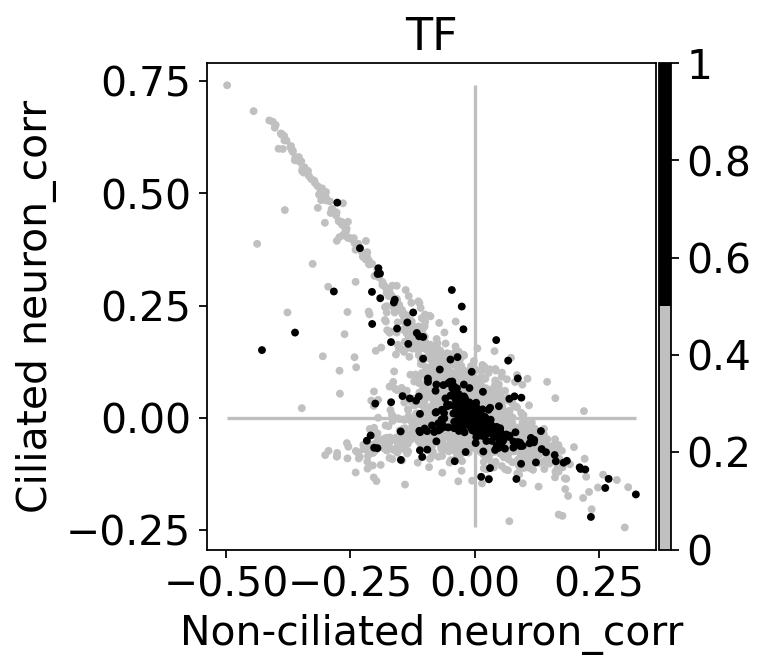

In [71]:
# call the actual plotting method via the estimator object
ax = g.plot_lineage_drivers_correlation(
    lineage_x="Non-ciliated neuron",
    adjust_text=True,
    lineage_y="Ciliated neuron",
    color="TF",
    cmap=cmap,
    legend_loc="none",
    title="driver genes",
    size=50,
    show=False,
)

# adjust and save
ax.set_xticks([-0.5, -0.25, 0.0, 0.25])
if save_figure:
    plt.savefig(FIG_DIR / "scatter_gene_correlations.pdf")

plt.show()

Highlight expression values, for Ciliated Neuron drivers: 

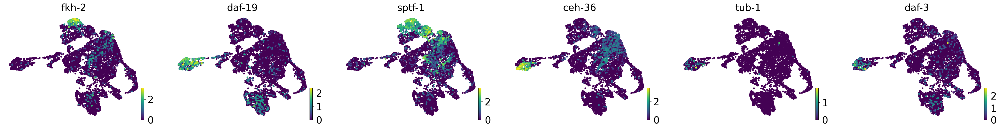

In [72]:
# define the gene set
cil_genes = ["fkh-2", "daf-19", "sptf-1", "ceh-36", "tub-1", "daf-3"]

# make sure they are all in the top-20 best correlating TFs for this trajectory
assert [gene in ciliated_df.index for gene in cil_genes], "Missing some ciliated genes"

# show their UMAP-epxression
fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "umap_ciliated_genes.pdf"

scv.pl.scatter(adata, c=cil_genes, s=50, **fig_kwargs)

Next, for non-ciliated neurons: 

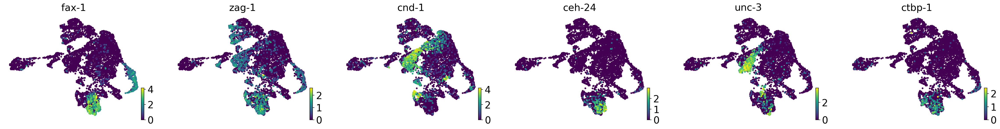

In [73]:
# define the gene set
non_cil_genes = ["fax-1", "zag-1", "cnd-1", "ceh-24", "unc-3", "ctbp-1"]

# make sure they are all in the top-20 best correlating TFs for this trajectory
assert [gene in non_ciliated_df.index for gene in non_cil_genes], "Missing some non-ciliated genes"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "umap_non_ciliated_genes.pdf"

scv.pl.scatter(adata, c=non_cil_genes, s=50, **fig_kwargs)

Lastly, for glia and excretory cells: 

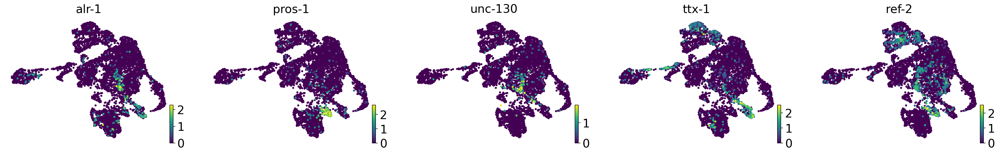

In [74]:
# define the gene set
glia_genes = ["alr-1", "pros-1", "unc-130", "ttx-1", "ref-2"]

# make sure they are all in the top-20 best correlating TFs for this trajectory
assert [gene in glia_df.index for gene in glia_genes], "Missing some Glia and excretory genes"

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "umap_glia_excretory_genes.pdf"

scv.pl.scatter(adata, c=glia_genes, s=50, **fig_kwargs)

### Show smoothed expression in time

Set global gene-trend fitting parameters:

In [75]:
pseudotime = "palantir_pseudotime"
data_key = "magic_imputed_data"
state = "Non-ciliated neuron"

# mgcv settings
n_knots_mgcv = 6

weight_threshold_mgcv = (1e-3, 1e-3)
smoothing_penalty_mgcv = 10.0

Select putative driver genes, including genes that are not TFs. 

In [76]:
driver_corr = mu.ul.return_drivers(adata, state=state, n_genes=50, only_tf=False)

Let's check for a known list of driver genes (not TFs this time). 

In [77]:
known_drivers = ["sdn-1", "syg-1", "madd-4", "mig-13", "flp-1"]
mask = np.in1d(known_drivers, driver_corr.index)

if not mask.all():
    print(f"Missing {np.array(known_drivers)[~mask]}. ")
else:
    print("Found all genes!")

Found all genes!


How many of these are TFs?

In [78]:
np.sum(driver_corr["TF"])

11

Plot their smoothed expression along pseudotime in a heatmap. 

100%|██████████| 50/50 [00:02<00:00, 22.16gene/s]


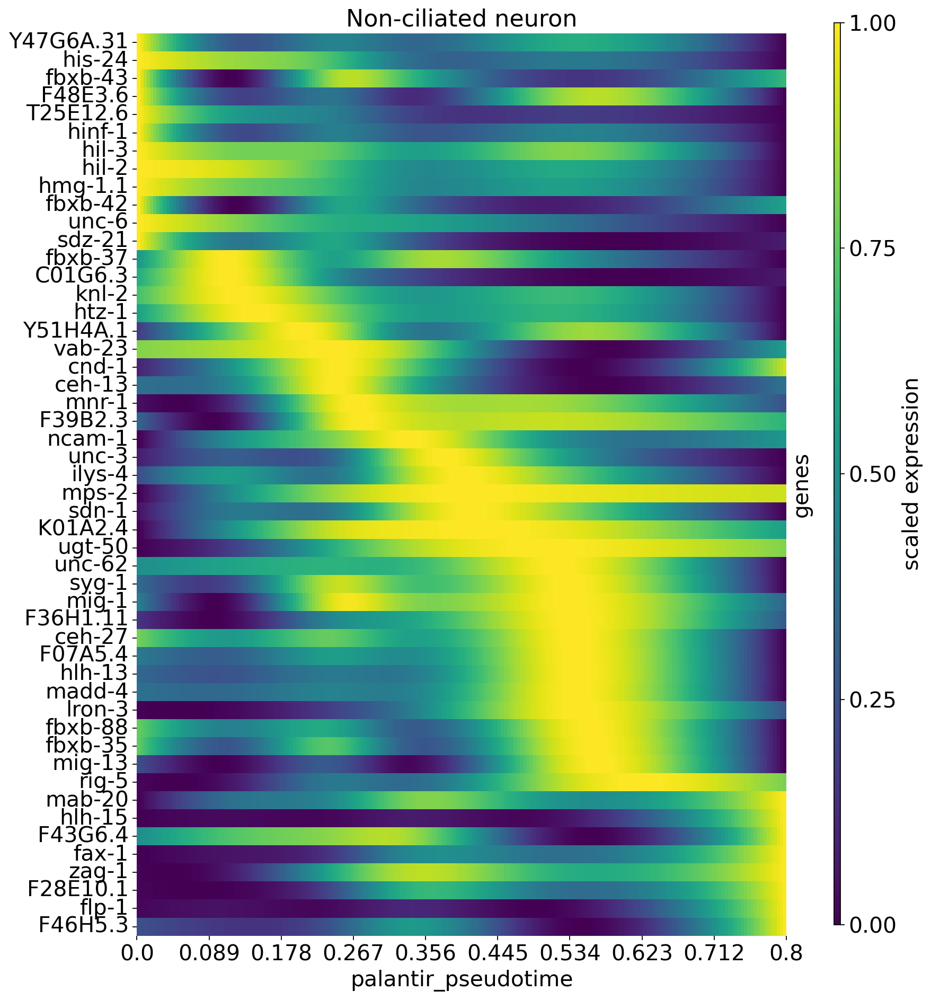

In [79]:
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=DeprecationWarning)

    model = cr.models.GAMR(adata, n_knots=n_knots_mgcv, smoothing_penalty=smoothing_penalty_mgcv)
    fig_kwargs = {
        "model": model,
        "genes": driver_corr.index,
        "lineages": state,
        "data_key": data_key,
        "time_key": pseudotime,
        "show_fate_probabilities": False,
        "figsize": (12, 14),
        "show_all_genes": True,
        "weight_threshold": weight_threshold_mgcv,
    }

    if save_figure:
        fig_kwargs["save"] = "heatmap_drivers.pdf"

    cr.pl.heatmap(adata, **fig_kwargs)

### Predict new TFs 

Visualize some new, predicted TFs. 

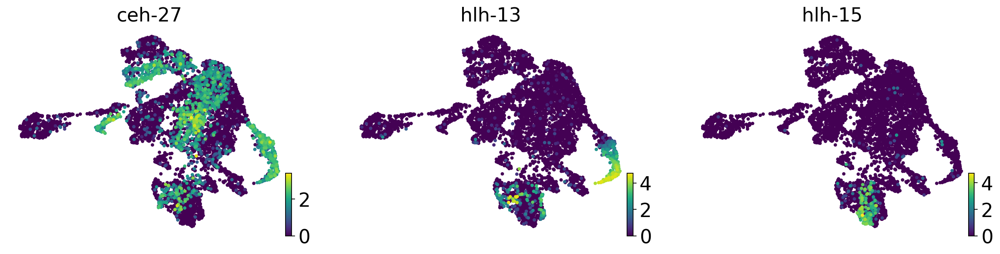

In [80]:
new_candidates = ["ceh-27", "hlh-13", "hlh-15"]

fig_kwargs = {}
if save_figure:
    fig_kwargs["save"] = "umap_non_ciliated_new_candidates.pdf"

scv.pl.scatter(adata, c=new_candidates, s=50, **fig_kwargs)